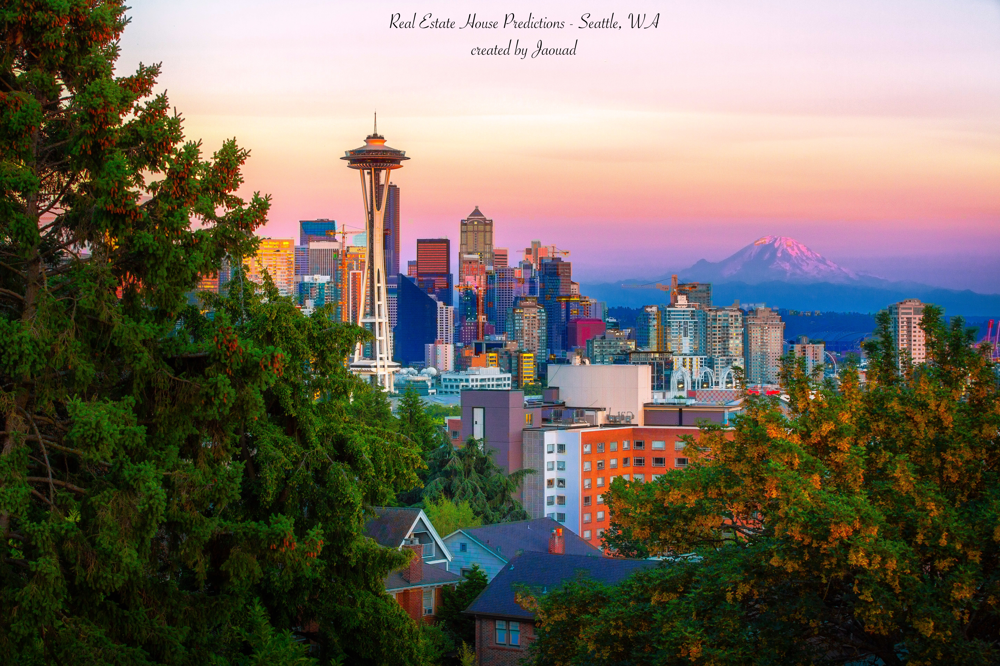

In [3]:
Image("/Users/jaouadelyousfi/Downloads/Project Linear_Regression.jpg")

In [4]:
# Set environment and libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from scipy import stats
import statsmodels.api as sms
import statsmodels.formula.api as smf
from IPython.display import Image
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
%matplotlib inline

In [5]:
# Read data in dataframe

df = pd.read_csv("King_County_House_prices_dataset.csv")
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [6]:
# Delete columns not needed

df.drop(["id", "lat", "long", "sqft_basement"], axis=1, inplace=True)

In [7]:
# Convent date in readable format

df["date"] = pd.to_datetime(df["date"])
df["Month"] = df["date"].apply(lambda date: date.month)
df["Year"] = df["date"].apply(lambda date: date.year)

df.drop("date", axis=1, inplace =True)

df.tail(10)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,Month,Year
21587,507250.0,3,2.50,2270,5536,2.0,NaN,0.0,3,8,2270,2003,0.0,98065,2270,5731,8,2014
21588,429000.0,3,2.00,1490,1126,3.0,0.0,0.0,3,8,1490,2014,0.0,98144,1400,1230,1,2015
21589,610685.0,4,2.50,2520,6023,2.0,0.0,NaN,3,9,2520,2014,0.0,98056,2520,6023,10,2014
21590,1010000.0,4,3.50,3510,7200,2.0,0.0,0.0,3,9,2600,2009,0.0,98136,2050,6200,3,2015
21591,475000.0,3,2.50,1310,1294,2.0,0.0,0.0,3,8,1180,2008,0.0,98116,1330,1265,2,2015
21592,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,3,8,1530,2009,0.0,98103,1530,1509,5,2014
21593,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,3,8,2310,2014,0.0,98146,1830,7200,2,2015
21594,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,3,7,1020,2009,0.0,98144,1020,2007,6,2014
21595,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,3,8,1600,2004,0.0,98027,1410,1287,1,2015
21596,325000.0,2,0.75,1020,1076,2.0,0.0,0.0,3,7,1020,2008,0.0,98144,1020,1357,10,2014


In [8]:
# Show size of the dataset

df.shape

(21597, 18)

In [9]:
# Show overview of the data set

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   price          21597 non-null  float64
 1   bedrooms       21597 non-null  int64  
 2   bathrooms      21597 non-null  float64
 3   sqft_living    21597 non-null  int64  
 4   sqft_lot       21597 non-null  int64  
 5   floors         21597 non-null  float64
 6   waterfront     19221 non-null  float64
 7   view           21534 non-null  float64
 8   condition      21597 non-null  int64  
 9   grade          21597 non-null  int64  
 10  sqft_above     21597 non-null  int64  
 11  yr_built       21597 non-null  int64  
 12  yr_renovated   17755 non-null  float64
 13  zipcode        21597 non-null  int64  
 14  sqft_living15  21597 non-null  int64  
 15  sqft_lot15     21597 non-null  int64  
 16  Month          21597 non-null  int64  
 17  Year           21597 non-null  int64  
dtypes: flo

In [10]:
# Check if zeros are contained 
df.isnull().values.any()

True

In [11]:
# View data description and see if there are any outliers

df.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,Month,Year
count,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,1986.620318,12758.283512,6.573969,2014.322962
std,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,685.230472,27274.441950,3.115061,0.467619
min,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,399.000000,651.000000,1.000000,2014.000000
25%,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,1490.000000,5100.000000,4.000000,2014.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,1840.000000,7620.000000,6.000000,2014.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,2360.000000,10083.000000,9.000000,2015.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,6210.000000,871200.000000,12.000000,2015.000000


In [12]:
# Replace the missing data, with the mean value

df['waterfront'].fillna((df['waterfront'].mean()), inplace=True)
df['yr_renovated'].fillna((df['yr_renovated'].mean()), inplace=True)
df['view'].fillna((df['view'].mean()), inplace=True)
df.dropna(inplace=True)
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,Month,Year
0,221900.0,3,1.00,1180,5650,1.0,0.007596,0.0,3,7,1180,1955,0.000000,98178,1340,5650,10,2014
1,538000.0,3,2.25,2570,7242,2.0,0.000000,0.0,3,7,2170,1951,1991.000000,98125,1690,7639,12,2014
2,180000.0,2,1.00,770,10000,1.0,0.000000,0.0,3,6,770,1933,83.636778,98028,2720,8062,2,2015
3,604000.0,4,3.00,1960,5000,1.0,0.000000,0.0,5,7,1050,1965,0.000000,98136,1360,5000,12,2014
4,510000.0,3,2.00,1680,8080,1.0,0.000000,0.0,3,8,1680,1987,0.000000,98074,1800,7503,2,2015


In [13]:
# Check if still zeros are contained 

df.isnull().sum()

price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
yr_built         0
yr_renovated     0
zipcode          0
sqft_living15    0
sqft_lot15       0
Month            0
Year             0
dtype: int64

In [14]:
# Convert values to integer with float

df['waterfront'] = np.round(df['waterfront'])
df['bathrooms'] = np.round(df['bathrooms'])
df['yr_renovated'] = np.round(df['yr_renovated'])

df['floors'] = np.round(df['floors'])
df['view'] = np.round(df['view'])
df.head(3)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,Month,Year
0,221900.0,3,1.0,1180,5650,1.0,0.0,0.0,3,7,1180,1955,0.0,98178,1340,5650,10,2014
1,538000.0,3,2.0,2570,7242,2.0,0.0,0.0,3,7,2170,1951,1991.0,98125,1690,7639,12,2014
2,180000.0,2,1.0,770,10000,1.0,0.0,0.0,3,6,770,1933,84.0,98028,2720,8062,2,2015


array([[<AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'bathrooms'}>,
        <AxesSubplot:title={'center':'sqft_living'}>],
       [<AxesSubplot:title={'center':'sqft_lot'}>,
        <AxesSubplot:title={'center':'floors'}>,
        <AxesSubplot:title={'center':'waterfront'}>,
        <AxesSubplot:title={'center':'view'}>],
       [<AxesSubplot:title={'center':'condition'}>,
        <AxesSubplot:title={'center':'grade'}>,
        <AxesSubplot:title={'center':'sqft_above'}>,
        <AxesSubplot:title={'center':'yr_built'}>],
       [<AxesSubplot:title={'center':'yr_renovated'}>,
        <AxesSubplot:title={'center':'zipcode'}>,
        <AxesSubplot:title={'center':'sqft_living15'}>,
        <AxesSubplot:title={'center':'sqft_lot15'}>],
       [<AxesSubplot:title={'center':'Month'}>,
        <AxesSubplot:title={'center':'Year'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

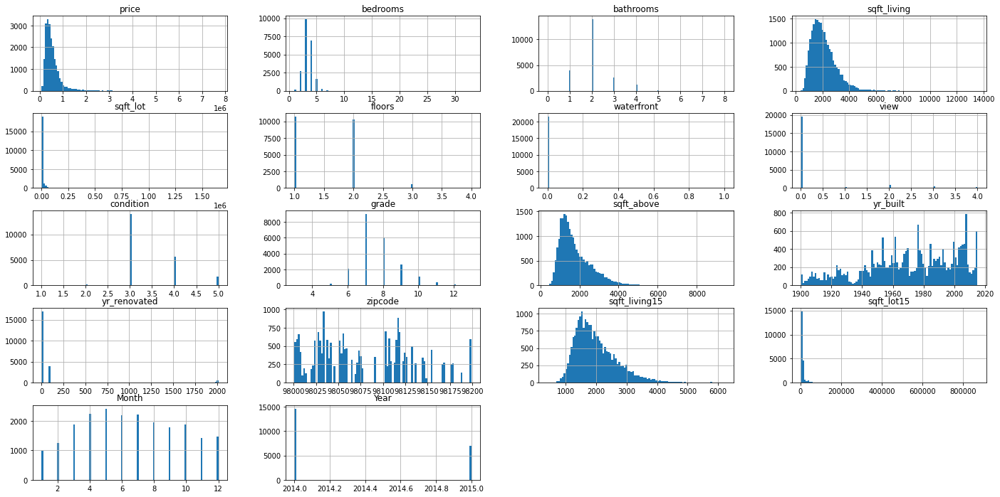

In [15]:
# Plot overview of data

df.hist(bins=100, figsize=(24, 12))

<AxesSubplot:>

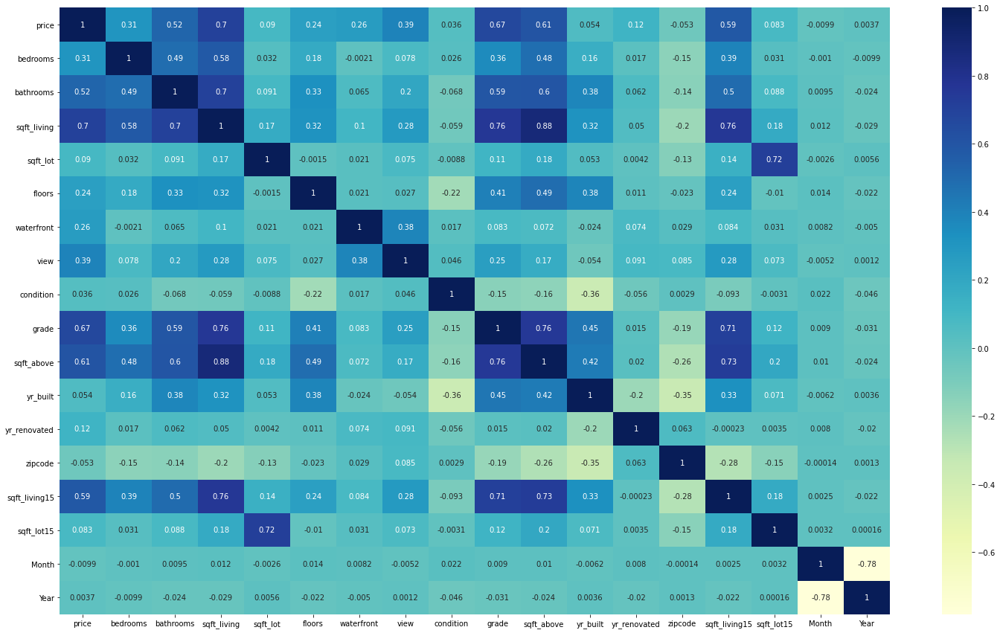

In [16]:
# Display the degree of correlation between the data 

fig, ax = plt.subplots(figsize=(25,15)) 
sns.heatmap(df.corr(),annot=True, ax=ax, cmap="YlGnBu")

Text(0, 0.5, 'price')

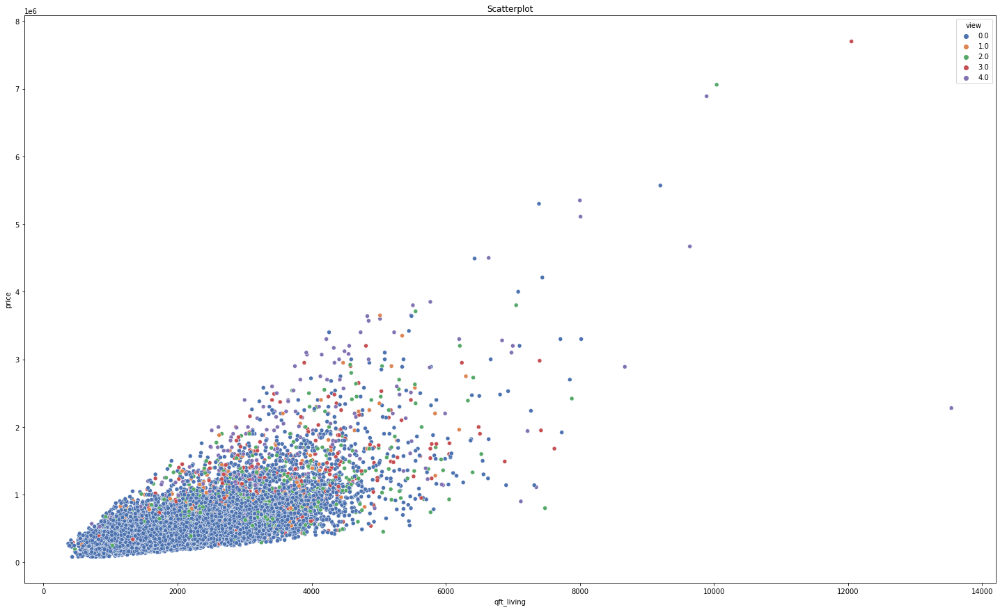

In [17]:
# The strongest correlation between independent and target varibale plots

fig, ax = plt.subplots(figsize=(25,15)) 
sns.scatterplot(x='sqft_living',y='price',data=df,hue='view',palette = 'deep', ax=ax)

plt.title('Scatterplot')
# Set x-axis label
plt.xlabel('qft_living')
# Set y-axis label
plt.ylabel('price')

In [18]:
# Prepare data for modeling
# Choose the predictor and add a constant term
X = df[['sqft_living']]
y = df.price
# Our model needs an intercept so we add a column of 1s:
X = sms.add_constant(X)
display(X.head())
display(y.head())

,const,sqft_living
0,1.0,1180
1,1.0,2570
2,1.0,770
3,1.0,1960
4,1.0,1680


0    221900.0
1    538000.0
2    180000.0
3    604000.0
4    510000.0
Name: price, dtype: float64

In [19]:
a = smf.ols(formula='price ~ sqft_living', data=df).fit().summary()
a

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.493
Model:                            OLS   Adj. R-squared:                  0.493
Method:                 Least Squares   F-statistic:                 2.097e+04
Date:                Sun, 06 Jun 2021   Prob (F-statistic):               0.00
Time:                        22:19:12   Log-Likelihood:            -3.0006e+05
No. Observations:               21597   AIC:                         6.001e+05
Df Residuals:                   21595   BIC:                         6.001e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -4.399e+04   4410.023     -9.975      0.000   -5.26e+04   -3.53e+04
sqft_living   280.8630      1.939    144.819      0.000     277.062     284.664
==============================================================================
Omnibus:                    14801.942   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           542662.604
Skew:                           2.820   Prob(JB):                         0.00
Kurtosis:                      26.901   Cond. No.                     5.63e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.63e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [20]:
# We split our data into training and test data

X = df[['sqft_living']].values
y = df['price'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.25)

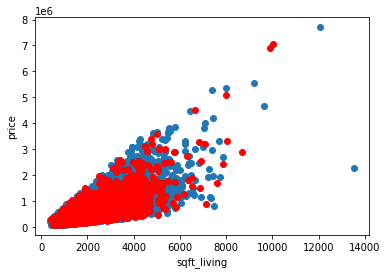

In [21]:
# How good is my prediction 

plt.scatter(X_train, y_train)
plt.scatter(X_test, y_test, color="red")
plt.xlabel("sqft_living" )
plt.ylabel("price")
plt.show()

<AxesSubplot:xlabel='grade', ylabel='price'>

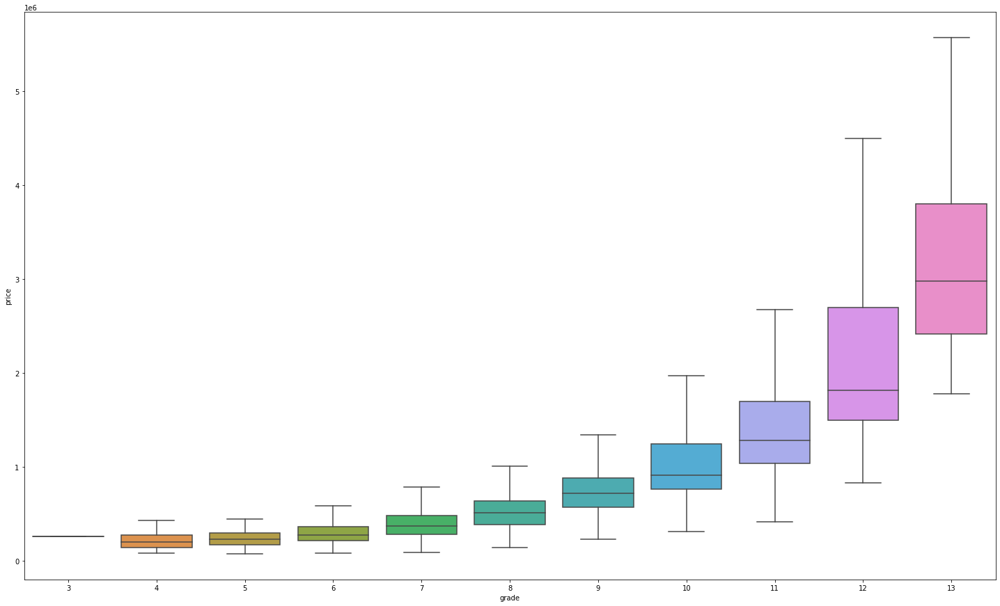

In [22]:
# The second strongest correlation between independent and target varibale plots

fig, ax = plt.subplots(figsize=(25,15)) 
sns.boxplot(x='grade',y='price',data=df,showfliers=False, ax=ax)

In [23]:
df["zipcode"].unique()

array([98178, 98125, 98028, 98136, 98074, 98053, 98003, 98198, 98146,
       98038, 98007, 98115, 98107, 98126, 98019, 98103, 98002, 98133,
       98040, 98092, 98030, 98119, 98112, 98052, 98027, 98117, 98058,
       98001, 98056, 98166, 98023, 98070, 98148, 98105, 98042, 98008,
       98059, 98122, 98144, 98004, 98005, 98034, 98075, 98116, 98010,
       98118, 98199, 98032, 98045, 98102, 98077, 98108, 98168, 98177,
       98065, 98029, 98006, 98109, 98022, 98033, 98155, 98024, 98011,
       98031, 98106, 98072, 98188, 98014, 98055, 98039])

<AxesSubplot:xlabel='zipcode', ylabel='price'>

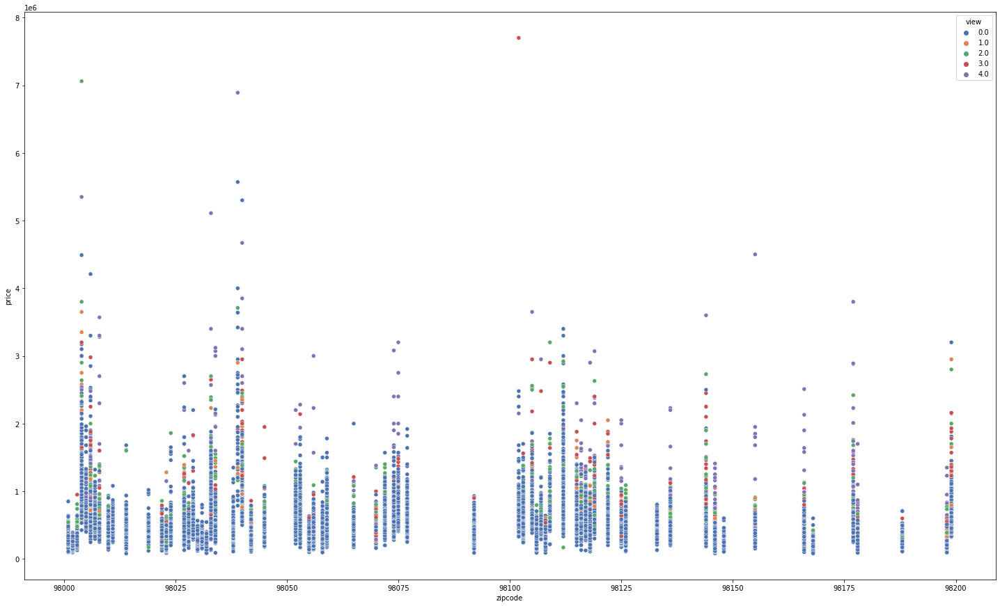

In [24]:
# Analyze data to better interpret its distribution 

fig, ax = plt.subplots(figsize=(25,15)) 
sns.scatterplot(x='zipcode',y='price',data=df,hue='view',palette = 'deep', ax=ax)

In [25]:
#a = smf.ols(formula='price ~ sqft_living + bathrooms  + grade + condition + sqft_lot + sqft_above + sqft_living15 + C(zipcode)', data=df).fit().summary()
#a

In [26]:
df = pd.get_dummies(df, columns=["zipcode"])
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,221900.0,3,1.0,1180,5650,1.0,0.0,0.0,3,7,...,0,0,0,0,0,0,1,0,0,0
1,538000.0,3,2.0,2570,7242,2.0,0.0,0.0,3,7,...,0,0,0,0,0,0,0,0,0,0
2,180000.0,2,1.0,770,10000,1.0,0.0,0.0,3,6,...,0,0,0,0,0,0,0,0,0,0
3,604000.0,4,3.0,1960,5000,1.0,0.0,0.0,5,7,...,0,0,0,0,0,0,0,0,0,0
4,510000.0,3,2.0,1680,8080,1.0,0.0,0.0,3,8,...,0,0,0,0,0,0,0,0,0,0


In [27]:
X = df[["bedrooms","bathrooms","sqft_living", "grade","sqft_lot", "view", "condition","sqft_lot","zipcode_98178", "zipcode_98125", "zipcode_98028", "zipcode_98136", "zipcode_98074", "zipcode_98053", "zipcode_98003", "zipcode_98198", "zipcode_98146",
       "zipcode_98038", "zipcode_98007", "zipcode_98115", "zipcode_98107", "zipcode_98126", "zipcode_98019", "zipcode_98103", "zipcode_98002", "zipcode_98133",
       "zipcode_98040", "zipcode_98092", "zipcode_98030", "zipcode_98119", "zipcode_98112", "zipcode_98052", "zipcode_98027", "zipcode_98117", "zipcode_98058",
       "zipcode_98001", "zipcode_98056", "zipcode_98166", "zipcode_98023", "zipcode_98070", "zipcode_98148", "zipcode_98105", "zipcode_98042", "zipcode_98008",
       "zipcode_98059", "zipcode_98122", "zipcode_98144", "zipcode_98004", "zipcode_98005", "zipcode_98034", "zipcode_98075", "zipcode_98116", "zipcode_98010",
       "zipcode_98118", "zipcode_98199", "zipcode_98032", "zipcode_98045", "zipcode_98102", "zipcode_98077", "zipcode_98108", "zipcode_98168", "zipcode_98177",
       "zipcode_98065", "zipcode_98029", "zipcode_98006", "zipcode_98109", "zipcode_98022", "zipcode_98033", "zipcode_98155", "zipcode_98024", "zipcode_98011",
       "zipcode_98031", "zipcode_98106", "zipcode_98072", "zipcode_98188", "zipcode_98014", "zipcode_98055", "zipcode_98039"]].values

y = df["price"].values

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.25)

In [29]:
model = LinearRegression()
model.fit(X_train, y_train)
#print("Intercept: " +str(model.intercept_))
#print("Coef: " +str(model.coef_))

print("R2_Score: " + str(model.score(X_test, y_test)))

R2_Score: 0.7674287742096019


In [31]:
y_test_pred = model.predict(X_test)
y_test_pred[0]

117539.74891492724

In [32]:
from sklearn.metrics import mean_squared_error
import math
print("MSE: " + str(mean_squared_error(y_test, y_test_pred)))
print("RMSE: " + str(math.sqrt(mean_squared_error(y_test, y_test_pred))))

MSE: 31908704848.957275
RMSE: 178630.07823140334


In [33]:
df.head(4)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,221900.0,3,1.0,1180,5650,1.0,0.0,0.0,3,7,...,0,0,0,0,0,0,1,0,0,0
1,538000.0,3,2.0,2570,7242,2.0,0.0,0.0,3,7,...,0,0,0,0,0,0,0,0,0,0
2,180000.0,2,1.0,770,10000,1.0,0.0,0.0,3,6,...,0,0,0,0,0,0,0,0,0,0
3,604000.0,4,3.0,1960,5000,1.0,0.0,0.0,5,7,...,0,0,0,0,0,0,0,0,0,0


The difference amounts to 104360.00€

In [37]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

scores = cross_val_score(LinearRegression(),X_train_transformed,y_train, cv = KFold(n_splits = 10))
print(scores)
test = np.max(scores)
test

[0.84564575 0.87702371 0.83930252 0.86351837 0.8606053  0.85888818
 0.84544622 0.87732796 0.86209637 0.80141217]


0.8773279556920969

In [34]:
from sklearn.preprocessing import PolynomialFeatures

pf = PolynomialFeatures()
pf.fit(X_train)

X_train_transformed = pf.transform(X_train)
X_test_transformed = pf.transform(X_test)

model = model.fit(X_train_transformed, y_train)
print(model.score(X_test_transformed, y_test))

0.8616663800874034


In [35]:
y_test_pred = model.predict(X_test_transformed)
y_test_pred[0]

212651.70591182058

The difference amounts to 9248.00€

In [36]:
df.head(4)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,221900.0,3,1.0,1180,5650,1.0,0.0,0.0,3,7,...,0,0,0,0,0,0,1,0,0,0
1,538000.0,3,2.0,2570,7242,2.0,0.0,0.0,3,7,...,0,0,0,0,0,0,0,0,0,0
2,180000.0,2,1.0,770,10000,1.0,0.0,0.0,3,6,...,0,0,0,0,0,0,0,0,0,0
3,604000.0,4,3.0,1960,5000,1.0,0.0,0.0,5,7,...,0,0,0,0,0,0,0,0,0,0
